no_foam
foam
mixed_foam_no_foam

# Import

In [ ]:
import numpy as np
import pandas as pd
import random as r
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
plt.style.use('dark_background' )
from cycler import cycler       # cycler(linestyle=['-','--',':','-.') * cycler(color=colors) cycler(lw=[1,5])
plt.rc('axes', prop_cycle=cycler(color=list('rbygmcw')+['orangered', 'gray', 'gold','coral']))

import os
import sys
import time

from scipy import stats
from scipy.signal import savgol_filter
from scipy.ndimage import generic_filter
from scipy.signal import freqz
from scipy.signal import butter, lfilter

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Dropout
from keras import optimizers
from tensorflow import keras
import tensorflow as tf 

from keras.models import load_model

from tensorflow.keras.callbacks import Callback

class CustomCallback(Callback):  

    def __init__(self, filepath, stop=0.09):
        self.filepath = filepath
        self.min_loss = 1    
        self.min_epoch = 1  
        self.stop = stop 

    def on_epoch_end(self, epoch, logs=None):
        if logs['loss']>self.stop: self.model.stop_training = True
        if self.min_loss > logs['val_loss']: 
            self.min_loss = logs['val_loss']
            self.min_epoch = epoch+1
            self.model.save(self.filepath)

In [ ]:
# ______________ gdrive ______________
from google.colab import drive
drive.mount('/gdrive')

import json
# keys = '/gdrive/MyDrive/korobool/keys.json'
keys = '/gdrive/MyDrive/ai-labs-2022/caretech/aws/keys.json'

with open(keys) as f:
    keys = json.loads(f.read())

!pip install boto3 -q
import boto3
import botocore.config

Mounted at /gdrive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 91.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 10.0 MB/s eta 0:00:00


In [ ]:
#@title df - function-1
def file_names_bins_csvs(files):
    file_1 = [i for i in  files.split('\n') if len(i)>4]
    f1, f2= [i.split()[0] for i in file_1], []
    if len(file_1[0].split())>1:    f2 = [i.split()[1] for i in file_1]
    if '.bin' in f1[0]:
        bins, csvs = f1, f2
    else:
        bins, csvs = f2, f1
    return bins, csvs

def load_files(files, bucket="urowell2.0-devv", prefix='uploads/', keys=keys,  verbose=False):
    '''загрузка файлов bin+csv'''
    session = boto3.Session(aws_access_key_id=keys['aws_access_key_id'], 
                            aws_secret_access_key=keys['aws_secret_access_key'])
    client = session.client(
        "s3",
        config=botocore.config.Config(region_name="eu-north-1", signature_version="s3v4"),
        )
    aws_objects_keys = [prefix + f for f in files]
    for key in aws_objects_keys:
        client.download_file(bucket,  key, key.split("/")[-1])
        if verbose: print(key)

def butter_bandpass(lowcut, highcut, fs, order=6):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=6):
    '''Филтр средних частот - возвращает отфильтр data'''
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_lowpass(cutoff, fs, order=5):
    return butter(order, cutoff, fs=fs, btype='low', analog=False)

def butter_lowpass_filter(data, cutoff, fs, order=5):
    '''Филтр нижних частот - возвращает отфильтр data'''
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

def cut(x, start, size=1):     
    '''Возвращает np.array '''
    t = list(x[start:])          
    t1 = np.mean(t[:size])
    res = [t1]*(start) + t  
    return np.array(res)

def add_N(x, N, size=1):     
    '''Возвращает np.array '''
    t1 = np.mean(x[-size:])
    t = list(x) + [t1]*(N-len(x))     
    return np.array(t)


def cut_peak(x):
    L = len(x)
    m1 = max(x)
    x[0] = x[1]
    if L>2:
        if x[L-1]>0.9*m1 or x[L-1]==0: x[L-1] = x[L-2]
        x = [x[0]] + [(x[i-1]+x[i+1])/2 if x[i]>0.9*m1 or x[i]==0 else x[i] for i in range(1,L-1) ] + [x[L-1]] 
    return np.array(x)
    
def cut_peak_1(x, visual=False):
    '''Заменяет средним(і-1,і+1) если в окне(dx=15) 
    r1(mx1-mn)/r2(mx2-mn>n(10)  и  r1>r0=(max(x)-np.mean(x))/3 '''  

    def r_max(x, i, n=10, r0=0.3):
        x = list(x)
        r1 = max(x) - min(x)
        i_max = x.index(max(x)) + i    
        x.remove(max(x))
        r2 = max(x) - min(x)
        if r1<r0 or r1 == r2 or r1 == 0: i_max=-1
        elif r2 == 0: 
            i_max        
        elif r1/r2<n: i_max=-1
        # if i_max>0: print(f'{i}    r1={r1:.5f} r2={r2:.5f} ')
        return i_max

    x = np.array(x)
    dx=15                           # window    
    r0 = (max(x)-np.mean(x))/3      # (max - min) > r0
    L = len(x)
    ind = [r_max(x[i*dx:(i+1)*dx], i*dx, 10, r0) for i in range(L//dx)]         # [index_peak or -1]
    ind = [i  for i in ind if i>0]                                              # [index_peak]
    x_mean = np.array([(x[i-1]+x[i+1])/2 for i in ind])                         # пики заменить средним

    if visual:
        y_max = 4; y_min = 2
        fig, axes = plt.subplots(1)
        fig.set_size_inches(15, 3 ) 
        axes.stem(ind, [y_max]*len(ind), linefmt='--g', markerfmt='None', basefmt='None', bottom = y_min)
        axes.plot(x)

    x[ind] = x_mean
    return x

def read_file_to_df(filename):
    with open(filename) as f:
        data = np.fromfile(f, dtype='<u2')
    df = pd.DataFrame(cut_peak(data), columns=['x'])   # df['measure time(ms)'] = df.index * 18 #np.arange(start=0, stop=10, step=3)
    df['x_lg'] = cut_peak_1(np.log10(df.x))
    return df

def interpolate_x_to_N(y1, N2, shift=0):
    '''Расчет '''
    fx = lambda x, x1, x2, y1, y2: y1 + (y2-y1)/(x2-x1)*(x-x1)
    y2 = []
    N1 = len(y1)
    x1 = np.append(np.arange(N1) * N2/N1, N2)
    k = 0
    for i in range(N2):
        if i == 0 :      y2.append(y1[0])            
        elif k >= N1-1:  y2.append(y1[N1-1])     
        elif i < x1[k+1]:            
            y2.append(fx(i, x1[k], x1[k+1], y1[k], y1[k+1]))            
        else:    
            k += 1
            if k >= N1-1: 
                y2.append(y1[N1-1] )
            else:
                y2.append(fx(i, x1[k], x1[k+1], y1[k], y1[k+1]))
    y2 = y2[shift:] + [y2[-1]]*shift
    return y2

def add_diff(x):
    x['fl_f'] = np.insert(np.diff(x['flow_meter']), 0, 0)

def add_interpolate(x1,x2,shift=0):
    x1['fl_f'] = interpolate_x_to_N(x2['fl_f'], len(x1), shift)

def len_to_max(t, N, size=30):
    k = list(t.columns)      
    d = {k[i]: [np.mean(t[k[i]][-size:])]*(N-len(t)) for i in range(len(k))}
    return pd.concat([t, pd.DataFrame(d)], ignore_index=True)

def add_x(x, name, data):
    x[name] = data
    
def freq_filter(x,frequencies, fs=58, order=6, size=166, start_cut=250, dx=0):
    d1, d2={}, {}
    f = [0] + frequencies
    d1['f_0_'+str(f[1])] = cut(butter_lowpass_filter(x, f[1], fs, order), start_cut)
    d2['d_0_'+str(f[1])] = generic_filter(d1['f_0_'+str(f[1])], np.std, size)

    for i in range(2, len(f)):    
        txt = str(f[i-1])+'_'+str(f[i])
        if i==2:  
            d1['f_'+txt] = cut(butter_bandpass_filter(x, f[i-1], f[i]+dx, fs, order), start_cut)
        else:
            d1['f_'+txt] = cut(butter_bandpass_filter(x, f[i-1]-dx, f[i]+dx, fs, order), start_cut)
        d2['d_'+txt] = generic_filter(d1['f_'+txt], np.std, size)
    df_f = pd.DataFrame(d1 | d2)
    return df_f

def freq_filter_df(x,frequencies, fs=58, order=5, size=166, start_cut=250, dx=0):
    X = x['x_lg']
    d1, d2={}, {}
    f = [0] + frequencies
    d1['f_0_'+str(f[1])] = cut(butter_lowpass_filter(X, f[1], fs, order), start_cut*2)
    d2['d_0_'+str(f[1])] = generic_filter(d1['f_0_'+str(f[1])], np.std, size)
    
    x['std'] = generic_filter(X, np.std, size=size)
    x['f_no_low'] = X - d1['f_0_'+str(f[1])]                    # no_low_freq
    x['d'] = generic_filter(x['f_no_low'], np.std, size=size)     #  dispersion
    x['ds'] = savgol_filter(x['d'], 151, 3)                     # disp_savgol

    for i in range(2, len(f)):    
        txt = str(f[i-1])+'_'+str(f[i])
        if i==2:  
            d1['f_'+txt] = cut(butter_bandpass_filter(X, f[i-1], f[i]+dx, fs, order), start_cut)
        else:
            d1['f_'+txt] = cut(butter_bandpass_filter(X, f[i-1]-dx, f[i]+dx, fs, order), start_cut)
        d2['d_'+txt] = generic_filter(d1['f_'+txt], np.std, size)
    df_f = pd.DataFrame(d1 | d2)
    return pd.concat([x, df_f], axis=1)


def get_start_x(x, N=50, kR=2, N_del=50, dt = 0):
    '''Возвращает индекс СТАРТА, FINISH по sharp['x']'''        
    x1 = x[::-1]; L = len(x); dt1=0
    R0 = max(x[N_del:N_del+N]) - min(x[N_del:N_del+N])
    R1 = max(x1[N_del:N_del+N]) - min(x1[N_del:N_del+N])
    R0 = max(R0,R1)

    x0 = min(x[N_del:N_del+N]) + R0/2
    for i,xi in enumerate(x[N_del:]):
        dx = abs(xi - x0)
        if dx > R0 * kR:          
            break
    if i>dt: dt1 = dt
    start = i+N_del - dt1      
    
    x0 = min(x1[N_del:N_del+N]) + R0/2
    for i,xi in enumerate(x1[N_del:]):
        dx = abs(xi - x0)
        if dx > R0 * kR:          
            break
    if i>dt: dt1 = dt
    finish = L - i + dt1
    return start, finish

def d_max_calc(x, list_k): 
    '''Возврвщает d_max = dict(k:v) k-параметр v-max
    list_k=['xx','ev','ef','fil','fl','fh','fnl','d','ds']
    x=df.n2'''
    list_v = [0]*len(list_k)
    d = dict(zip(list_k, list_v))
    d2 = {k: [max(i[k]) for i in x] for k in d}
    d_max = {k:max(v) for k,v in d2.items()}
    return d_max

def add_df_segment(x,  Nsegm, segment, dl_segm, d_max):  
    '''Сегментация+norm df['segm'] <= (df.bin[d_max])  len(df['segm'])=2*Nsegm
    segment=дл.сегм, Nsegm=кол.сегм, dl_segm=шаг, d_max{k:v}=словарь из норм.
    '''    
    d={}
    for k in d_max:     
        xk = list(x[k])
        xk = [xk[0]]*segment + xk
        s = [np.mean(xk[(i*dl_segm):i*dl_segm+segment]) for i in range(Nsegm)]
        d[k] = np.array( [s[0]]*Nsegm + s) / d_max[k]
        
    no_mean = ['std', 'd', 'ds'] 
    for k in no_mean:
        s = [x[k][i*dl_segm] for i in range(Nsegm)]
        d[k] = np.array( [s[0]]*Nsegm + s) / d_max[k]

    df_segm = pd.DataFrame(d)
    return df_segm

def vectorize(x, N, start, param_names): 
    '''Формирует Х(Nфайлов, 2хNsegm, N_param) - list[]
    param_names = ['xx', 'fl', 'fnl', 'fh', 'ds', 'd'] '''  
    return [[(x[k][i]) for k in param_names] for i in range(start, start+N)]

def split_step(x, step=120):  # step = Nsegm 
    '''Формирует Х - для LSTM model
    x[0..N] ==> x_step[ [0..st] .. [N-st..N] ] '''
    n_x = len(x)  
    x_step = ([x[i-step:i] for i in range(step, n_x)])     
    return (x_step)

def st_fn_div_d(Ne, d, L1):  
    '''Разбивает х(Ne=len(x) на d частей(длина одного графка=L1)
    возвращает индексы Старт, Финиш - каждой части'''  
    nn = (Ne-1)//(d*L1)
    st = [i*L1*d for i in range(nn+1)]
    fn = [st[i+1] for i in range(nn)] + [Ne]
    return st, fn

def analiz_predict(x1, d_max, t1):
    L = len(x1); 
    i1, i2 = get_start_x(x1, dt = 0, N_del=5, N=5)           # get_start_x(x['fl_f'], N=10,N_del=10, dt=0)
    # i2 = get_sharp_finish(x1, dt = 0, N=5, kR=5)   
    v = sum(x1[i1:i2])*t1
    m = max(x1) #*d_max      
    im = max([0 if x1[i]<m else i for i in range(L)])   
    tm = (im) * t1    # f = 58 dl_segm=33pts
    T = (i2-i1) * t1      
    TQmax = (im-i1)*t1
    return i1, i2, im, m, v, T, TQmax

def MXE(x1, x2):
    L = len(x1)   
    MAE = sum([abs(x1[i]-x2[i]) for i in range(L)])/L
    MSE = sum([(x1[i]-x2[i])**2 for i in range(L)])/L
    MSE_1 = MSE**0.5    
    return MAE, MSE, MSE_1    

def df_to_xy(df, Nsegm, param_names):
    y_n = len(df) 
    y0, x0 = [], []
    y = np.hstack(df.apply(lambda x: list(x.segm.fl_f)[:], axis=1).to_numpy())
    y = y.reshape((y_n, -1))   
    for yi in y:  y0 += list(yi[Nsegm:])    

    XX = df.apply(lambda x: vectorize(x.segm, 2*Nsegm, 0, param_names), axis=1)
    X = np.array([i for i in XX])
    for x in X:   x0 +=  split_step(x, Nsegm ) 

    y0 = np.array(y0)
    x0 = np.array(x0)
    return x0, y0

# Download files [bin / csv]

[best.xlsx](https://docs.google.com/spreadsheets/d/1fuJ02S5q6-XJ1fGyq3Yj51DXlPgknpNc/edit?usp=share_link&ouid=102191517035546209800&rtpof=true&sd=true)

In [ ]:
# load = (263x2 file - 3m24s)
exsel = '/gdrive/MyDrive/korobool/fs200/best/best.xlsx'

df_xls = pd.read_excel(exsel, 'files', usecols=['bins', 'csvs', 'comments', 'role']).fillna(0)    # na_filter = False [NaN ==> '']
df_xls = df_xls[df_xls['role'].isin(['train','foam'])].reset_index(drop=True) 

index_nofoam = df_xls[(df_xls.role=='train')].index                              # df.iloc[index_train]
index_foam = df_xls[(df_xls.role=='foam')].index

df_nofoam = df_xls.iloc[index_nofoam].reset_index(drop=True) 
df_foam = df_xls.iloc[index_foam].reset_index(drop=True) 

bins_nf, csvs_nf = list(df_nofoam.bins), list(df_nofoam.csvs)
bins_f, csvs_f = list(df_foam.bins), list(df_foam.csvs)
bins = bins_nf + bins_f
csvs = csvs_nf + csvs_f

N_file, N_nf, N_f = len(bins), len(bins_nf), len(bins_f)
N_test_nf, N_test_f = 0, 0
print(f'files = nf+f = {N_file}={N_nf}+{N_f};    N_test={N_test_nf}+{N_test_f} ')

# _______параметры_____
df_exp = pd.read_excel(exsel, 'plan').fillna(0)    # na_filter = False [NaN ==> '']

# _______ load_bins _____
if_load_bins = True      #@param {type:"boolean"}
if if_load_bins:
    load_files(bucket="caretech-uploads", keys=keys, files=bins+csvs, prefix='', verbose=0)

df_xls.head(1)

files = nf+f = 263=159+104;    N_test=0+0 


,csvs,bins,comments,role
0,1679317050_10521CBCC9F8_flowgen_1.csv,1679317049_10521CBCC9F8_VCNL4200_200.bin,Patterns,train


# Parametrs

In [ ]:
fs=200;     # N_file = len(bins)
frequencies = [1,5,15,30,45,60,75,90]

segment=166; dl_segm=33; size_d=166     # list_k = ['x',...
param_names = ['x_lg', 'std', 'f_0_1', 'f_1_5', 'f_5_15', 'f_15_30', 'f_30_45', 'f_45_60', 'f_60_75', 'f_75_90', 'd_0_1', 'd_1_5', 'd_5_15', 'd_15_30', 'd_30_45', 'd_45_60', 'd_60_75', 'd_75_90']

shift = 250;    dt=10
print(f'N_file = {N_file},  N_param = {len(param_names)}')

gpath = '/gdrive/MyDrive/korobool/fs200/best/save10/'
if not (os.path.exists(gpath)): os.mkdir(gpath)
# if not (os.path.exists(f'{gpath}save_loss_png/')): os.mkdir(f'{gpath}save_loss_png/')



N_file = 263,  N_param = 18


In [ ]:
#@title df - calculation (12m20s)

df = pd.DataFrame({'bins_names':bins, 'csvs_names':csvs})     # названия файлов
df['csv'] = df.csvs_names.apply(lambda x: pd.read_csv(x)[['flow_meter']])       # df.csv['flow_meter']
_ = df.apply(lambda x: add_diff(x.csv), axis=1)                                 # df.csv['fl_f'] = diff
df['bin'] = df.bins_names.apply(lambda x: read_file_to_df(x))                   # df.bin[cut_peak['x'] + ['x_lg'] 
_ = df.apply(lambda x: add_interpolate(x.bin, x.csv, shift=shift), axis=1)      # df.bins['fl_f'] = interpolate(df.csvs['fl_f'])
df['len'] = df.bin.apply(lambda x: len(x))                                      # df['len']

max_L = df.len.max()
Nelem = int((max_L//dl_segm + 1)*dl_segm)  
Nsegm = int(Nelem//dl_segm)
df['bin'] = df.bin.apply(lambda x: len_to_max(x, max_L))                        # len_to_max(df['bin'], max_L)
df['bin'] = df.bin.apply(lambda x: freq_filter_df(x, frequencies, fs))          # df.bin['frequencies'] + std, d, ds, f_no_low

dt=10
st_fn = df['bin'].apply(lambda x: get_start_x(x['fl_f'], N=10,N_del=10, dt=dt)) # def get_start(['fl_f'], dt):
df['start'], df['finish'] = [x[0] for x in st_fn], [x[1] for x in st_fn]
df['time_len'] = df['finish'] - df['start'] - dt - dt                           # dt_st dt_fn

df['L1'] = df.apply(lambda x: sum(x['bin']['x_lg'][x['start']:x['start']+100]) /100, axis=1)
df['L2'] = df.apply(lambda x: sum(x['bin']['x_lg'][x['finish']-100:x['finish']])/100, axis=1)

list_k_norm = list(df.bin[0].columns);  
# list_k = ['x','x_lg', 'fl_f', 'std', 'f_no_low', 'd', 'ds','f_0_1', 'f_1_5', 'f_5_15', 'f_15_30', 'f_30_45', 'f_45_60', 'f_60_75', 'f_75_90', 'd_0_1', 'd_1_5', 'd_5_15', 'd_15_30', 'd_30_45', 'd_45_60', 'd_60_75', 'd_75_90']
d_max =  d_max_calc(df.bin, list_k_norm)

df['segm'] = df.bin.apply(lambda x: add_df_segment(x,  Nsegm, segment, dl_segm, d_max)) 
_ = df.apply(lambda x: add_x(x.segm, 'L1', x.L1/d_max['x_lg']), axis=1)         # add L1, L2
_ = df.apply(lambda x: add_x(x.segm, 'L2', x.L2/d_max['x_lg']), axis=1)  

print(f'N_file={N_file}   train={ N_file-N_test_nf-N_test_f}    N_test={N_test_nf}+{N_test_f} ')

d_param = {'d_max':d_max, 'list_k':list_k_norm,
            'param_names':param_names,  'n_parametr':len(param_names),
            'Nelem':int(Nelem),  'Nsegm':int(Nsegm), 'dl_segm':dl_segm, 'segment':segment,                
            'fs':fs, 'shift':shift , 'dt_start':dt, 'dt_finish':dt}

if_seve_param = False    #-@param {type:"boolean"}
if if_seve_param:
    with open(gpath+'best.json', 'w+') as f:
        f.write(json.dumps(d_param))

N_file=263   train=263    N_test=0+0 


In [ ]:
#@title index - RUN
run = "0"    #@param [0, 1, 2, 3, 4]
run = int(run)
N_test_nf, N_test_f = 5, 5

r.seed(3)       # == 3 - фиксация рандома/перемешивания
i_mix_0 = list(range(N_f+N_nf));        r.shuffle(i_mix_0)
i_nf_0 = list(range(N_nf));             r.shuffle(i_nf_0)
i_f_0 = list(range(N_nf,N_f+N_nf));     r.shuffle(i_f_0)

ar_del = lambda a, d: [i for i in a if i in (set(a)-set(d))]

i_nf_test = i_nf_0[run*N_test_nf:(run+1)*N_test_nf]
i_f_test = i_f_0[run*N_test_f:(run+1)*N_test_f]
i_nf_train = ar_del(i_nf_0, i_nf_test)
i_f_train = ar_del(i_f_0, i_f_test)
i_mix_train = ar_del(i_mix_0, i_nf_test+i_f_test)

print(f'run={run}    mix_train=nf+f = {len(i_mix_train)}={len(i_nf_train)}+{len(i_f_train)}     nf_test={len(i_nf_test)}    f_test={len(i_f_test)} ')
print(f'nf_0={i_nf_0} \nnf_test={i_nf_test}  \nf_0={i_f_0}  \nf_test{i_f_test}')

# _________ df_train/test __________
# df_mix_train = df.iloc[i_mix_train]
df_mix_train = df.iloc[i_mix_0]
df_nf_test = df.iloc[i_nf_test].reset_index(drop=True) 
df_f_test = df.iloc[i_f_test].reset_index(drop=True) 

df_0 = df_mix_train

run=0    mix_train=nf+f = 253=154+99     nf_test=5    f_test=5 
nf_0=[90, 154, 53, 96, 115, 102, 33, 150, 70, 55, 138, 147, 109, 83, 89, 26, 101, 47, 18, 48, 137, 72, 49, 46, 112, 156, 121, 13, 10, 119, 42, 86, 152, 127, 148, 82, 44, 85, 29, 81, 118, 99, 36, 158, 57, 106, 77, 125, 71, 76, 27, 97, 128, 75, 23, 19, 37, 59, 113, 24, 22, 108, 63, 20, 40, 92, 149, 65, 133, 4, 157, 142, 91, 98, 5, 94, 155, 93, 41, 60, 88, 54, 66, 117, 79, 140, 31, 34, 114, 151, 136, 80, 134, 0, 129, 35, 120, 123, 153, 146, 124, 25, 28, 45, 7, 100, 103, 126, 69, 32, 16, 43, 14, 78, 6, 52, 68, 67, 2, 84, 135, 38, 64, 21, 15, 95, 61, 3, 12, 110, 50, 131, 144, 11, 62, 30, 141, 17, 58, 87, 139, 73, 132, 116, 8, 56, 143, 111, 130, 122, 1, 51, 39, 105, 9, 104, 145, 107, 74] 
nf_test=[90, 154, 53, 96, 115]  
f_0=[229, 186, 160, 187, 210, 255, 161, 239, 193, 178, 176, 204, 179, 237, 259, 225, 215, 261, 180, 190, 167, 232, 205, 217, 253, 238, 212, 251, 216, 211, 241, 165, 254, 214, 209, 222, 228, 192, 196, 236, 201, 1

In [ ]:
#@title fit  (1ep=1m53s  sum=16m)
# arr_exp = [run]
arr_exp = [6,7,8,9]

for N_exp in arr_exp:    
    x0, y0 = df_to_xy(df_mix_train, Nsegm, param_names)
    n_features = x0.shape[2];   n_steps = x0.shape[1]
    
    model = Sequential()
    model.add(LSTM(df_exp['LSTM'][N_exp], input_shape=(n_steps, n_features)))
    model.add(Dense(df_exp['Dense1'][N_exp], activation=df_exp['activation'][N_exp]))
    model.add(Dropout(df_exp['Dropout'][N_exp]))
    model.add(Dense(df_exp['Dense2'][N_exp], activation=df_exp['activation'][N_exp]))
    model.add(Dropout(df_exp['Dropout'][N_exp]))
    model.add(Dense(1))
    # lr_schedule = keras.optimizers.schedules.ExponentialDecay( initial_learning_rate=0.0001, decay_steps=500, decay_rate=0.7)
    # opt = tf.optimizers.Adam(learning_rate=lr_schedule)
    # opt = tf.optimizers.Adam(learning_rate=d_model['learning_rate'])

    if df_exp['optimizers'][N_exp] == 'Adam':
        opt = tf.optimizers.Adam(learning_rate=df_exp['learning_rate'][N_exp], epsilon=df_exp['epsilon'][N_exp])
    if df_exp['optimizers'][N_exp] == 'Adamax':
        opt = tf.optimizers.Adamax(learning_rate=df_exp['learning_rate'][N_exp], epsilon=df_exp['epsilon'][N_exp])
    if df_exp['optimizers'][N_exp] == 'Nadam':
        opt = tf.optimizers.Nadam(learning_rate=df_exp['learning_rate'][N_exp], epsilon=df_exp['epsilon'][N_exp])
    if df_exp['optimizers'][N_exp] == 'RMSprop':
        opt = tf.optimizers.RMSprop(learning_rate=df_exp['learning_rate'][N_exp], rho=0.9, momentum=0.0, epsilon=df_exp['epsilon'][N_exp])
    if df_exp['optimizers'][N_exp] == 'SGD':
        opt = tf.optimizers.SGD(learning_rate=df_exp['learning_rate'][N_exp], momentum=0.0)

    model.compile(optimizer=opt, loss='mae')

    # создать если нет папки model
    gpath_model = f'{gpath}{N_exp:02}'
    model_name_N = f'{gpath_model}/best_run_{N_exp:02}.h5'
    if not (os.path.exists(gpath_model)): os.mkdir(gpath_model)
        
    # ------ Fit model ----------
    custom_callback = CustomCallback(filepath=model_name_N)   

    train_history = model.fit(x0, y0, epochs=df_exp['epochs'][N_exp], validation_split=0.2, verbose=1,  callbacks=[custom_callback])
    # train_history = model.fit(x0_f, y0_f, epochs=d_model['epochs'], validation_split=0.2, verbose=1)
    # train_history = model.fit(x0_mix, y0_mix, epochs=d_model['epochs'], validation_split=0.2, verbose=1)
    time_i = time.strftime('%H:%M:%S')
    print(f"{time_i}:  N_exp={N_exp},    min_epoch={custom_callback.min_epoch},   min_loss={custom_callback.min_loss:.4f}")

    # ------ Summarize history for loss ------
    fig, axes = plt.subplots( figsize=(10,2), dpi=80)
    ep = [i+1 for i in range(len(train_history.history['loss']))]
    axes.plot(ep, train_history.history['loss'], label='loss')
    axes.plot(ep, train_history.history['val_loss'], label='val_loss')
    axes.grid(axis='x', linestyle = ':');   axes.set_xticks(ep) 
    axes.set_xlabel(f'epochs  -  [N_exp={N_exp:02},  min_epoch={custom_callback.min_epoch},  min_loss={custom_callback.min_loss:.4f}]');  axes.legend()
    plt.savefig(f'{gpath_model}/loss_{N_exp:02}.png', bbox_inches='tight') 
    


In [ ]:
N_test_nf, N_test_f, run = 10, 10, 0

i_nf_test = i_nf_0[run*N_test_nf:(run+1)*N_test_nf]
i_f_test = i_f_0[run*N_test_f:(run+1)*N_test_f]


print(f'run={run}    mix_train=nf+f = {len(i_mix_train)}={len(i_nf_train)}+{len(i_f_train)}     nf_test={len(i_nf_test)}    f_test={len(i_f_test)} ')
print(f'nf_0={i_nf_0} \nnf_test={i_nf_test}  \nf_0={i_f_0}  \nf_test{i_f_test}')

# _________ df_train/test __________
df_nf_test = df.iloc[i_nf_test].reset_index(drop=True) 
df_f_test = df.iloc[i_f_test].reset_index(drop=True) 

excel_result_sheet = 'result'


run=0    mix_train=nf+f = 253=154+99     nf_test=10    f_test=10 
nf_0=[90, 154, 53, 96, 115, 102, 33, 150, 70, 55, 138, 147, 109, 83, 89, 26, 101, 47, 18, 48, 137, 72, 49, 46, 112, 156, 121, 13, 10, 119, 42, 86, 152, 127, 148, 82, 44, 85, 29, 81, 118, 99, 36, 158, 57, 106, 77, 125, 71, 76, 27, 97, 128, 75, 23, 19, 37, 59, 113, 24, 22, 108, 63, 20, 40, 92, 149, 65, 133, 4, 157, 142, 91, 98, 5, 94, 155, 93, 41, 60, 88, 54, 66, 117, 79, 140, 31, 34, 114, 151, 136, 80, 134, 0, 129, 35, 120, 123, 153, 146, 124, 25, 28, 45, 7, 100, 103, 126, 69, 32, 16, 43, 14, 78, 6, 52, 68, 67, 2, 84, 135, 38, 64, 21, 15, 95, 61, 3, 12, 110, 50, 131, 144, 11, 62, 30, 141, 17, 58, 87, 139, 73, 132, 116, 8, 56, 143, 111, 130, 122, 1, 51, 39, 105, 9, 104, 145, 107, 74] 
nf_test=[90, 154, 53, 96, 115, 102, 33, 150, 70, 55]  
f_0=[229, 186, 160, 187, 210, 255, 161, 239, 193, 178, 176, 204, 179, 237, 259, 225, 215, 261, 180, 190, 167, 232, 205, 217, 253, 238, 212, 251, 216, 211, 241, 165, 254, 214, 209, 222, 22

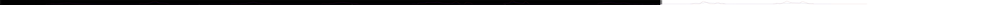

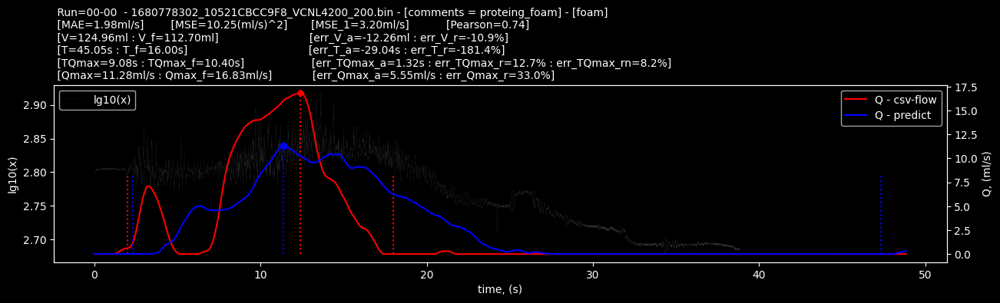

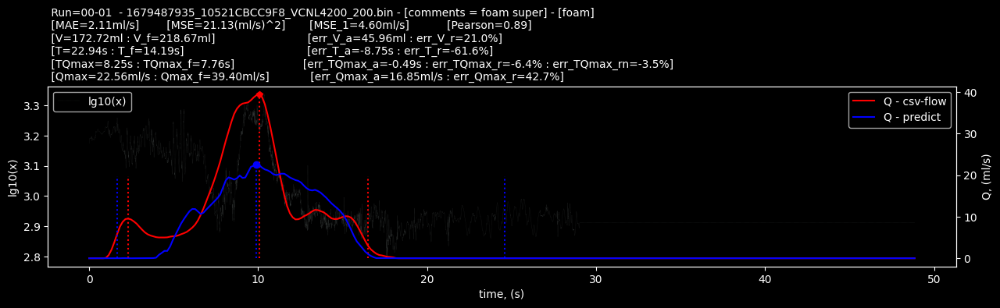

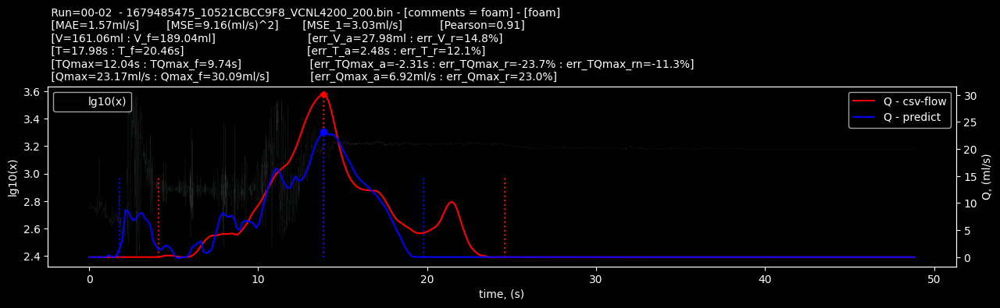

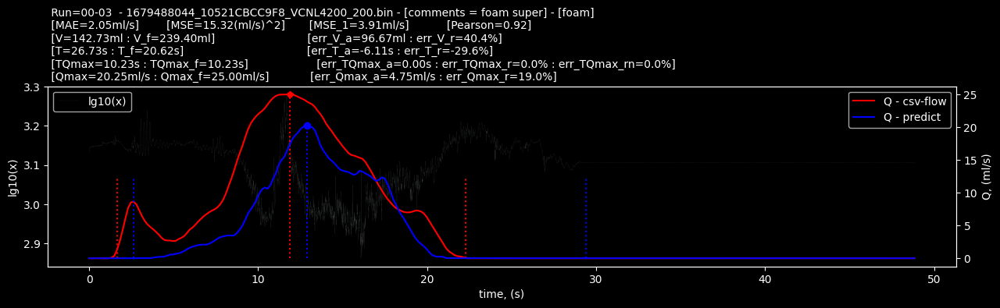

...

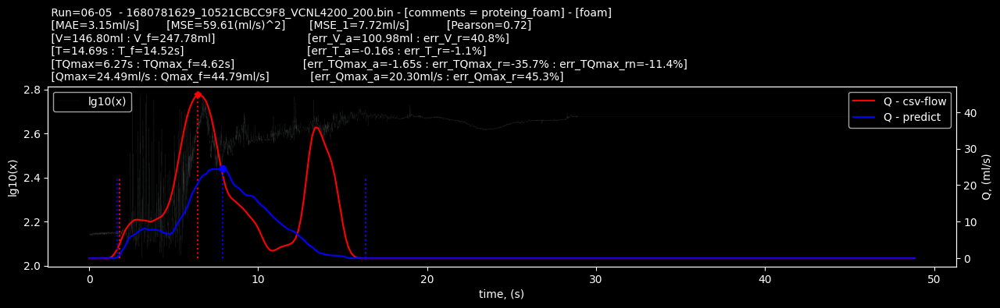

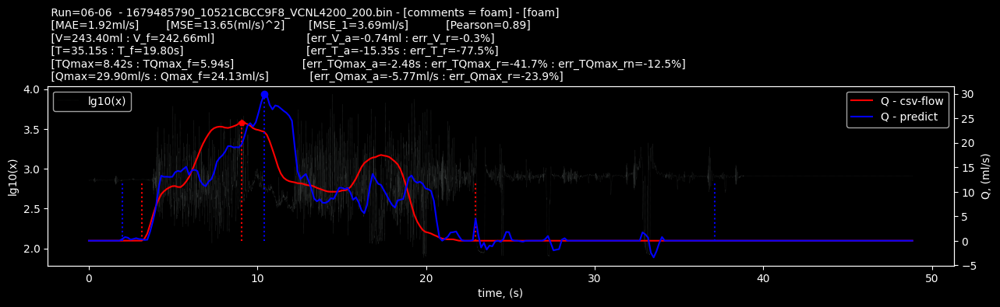

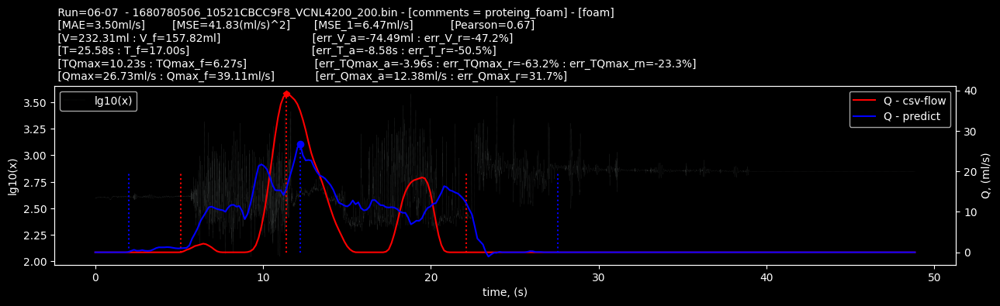

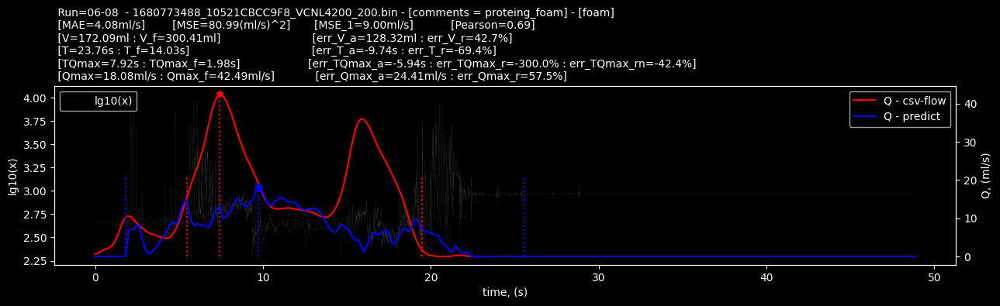

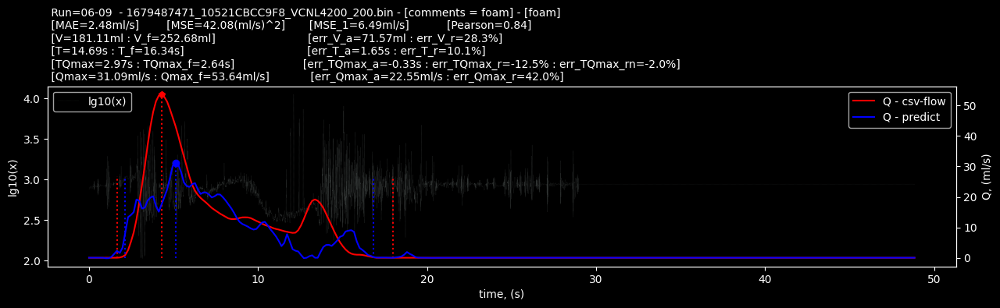

<ipython-input-18-ae8e8da3eb2a>:113: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result = df_result.append(df_N, ignore_index = True )


In [ ]:
#@title predict-Test_foam_ALL  (7x10f = 31m)
options = 'foam'    #-@param ["nofoam", "foam", "train"]
if options == 'nofoam': 
    df_calc = df_nf_test 
else: 
    df_calc = df_f_test

N_exp = run
arr_exp = [0,1,2,3,4,5,6]

if_save_png  = True     #@param {type:"boolean"} 
if_save_result = True   #@param {type:"boolean"} 
# __________calc - param___________
k_V=1
t1 = dl_segm / fs
t = [i*t1 for i in range(Nsegm)] 
t_n = [i/fs for i in range(max_L)]
result_save_name = ['N_exp', 'N', 'bin', 'T_f', 'T', 'err_T_a', 'err_T_r', 'TQmax_f', 'TQmax', 'err_TQmax_a', 'err_TQmax_r', 'err_TQmax_rn', 'Qmax_f', 'Qmax', 'err_Qmax_a', 'err_Qmax_r', 'V_f', 'V', 'err_V_a', 'err_V_r', 'MAE', 'MSE', 'MSE_1', 'Pearson', 'options']
df_N = pd.DataFrame(columns=result_save_name)
d1_save = dict(zip(result_save_name, [0]*len(result_save_name))) 

x_calc, y_calc = df_to_xy(df_calc, Nsegm, param_names)

n_parametr = len(param_names)
x_param = [0]*n_parametr     # ['xx'0, 'f_nf_1', 'L1'2, 'L2'3, 'Np', 'Nh', 'd', 'ds', 'f_03', 'f_1', 'd_f_03', 'd_f_1', 'd_f_1_28', 'd_f_1_5', 'd_f_5_15', 'd_f_15_20', 'd_f_20_28']
for p in range(n_parametr): x_param[p] = [i[-1][p] for i in x_calc]
st, fn = st_fn_div_d(Ne=len(y_calc), d=1, L1=Nsegm)

for N_exp in arr_exp:
    gpath_model = f'{gpath}{N_exp:02}'
    model_name_N = f'{gpath_model}/best_run_{N_exp:02}.h5'
    gpath_x = f'{gpath_model}/{options}'
    if not (os.path.exists(gpath_x)): os.mkdir(gpath_x)
    #___________load model___________
    model = load_model(model_name_N)

    #___________ prdict ___________
    pred_test = [model.predict(i.reshape((1, Nsegm, len(param_names))), verbose=0) for i in x_calc]
    pred_test = [i[-1][0] for i in pred_test]

    # All - plot(test)
    figure( figsize=(4*N_nf,3), dpi=80)
    plt.plot(y_calc, label=f'csv test({options})')
    plt.plot(pred_test, label='pred_test')
    plt.legend()
    if if_save_png: plt.savefig(f'{gpath_x}/all_{options}_{N_exp}.png' )  

    # culc - plot(test)
    predict_calc = np.array(pred_test)
    for i in range(len(df_calc)):   
        xi =  d_max['fl_f'] * k_V * predict_calc[st[i]:fn[i]]
        xi_f =  d_max['fl_f']*k_V * y_calc[st[i]:fn[i]]            

        i1, i2, iQmax, Qmax, V, T, TQmax = analiz_predict(xi, d_max['fl_f'], t1)
        i1_f, i2_f, iQmax_f, Qmax_f, V_f, T_f, TQmax_f = analiz_predict(xi_f, d_max['fl_f'], t1)

        err_T_a = (T_f-T);                  err_T_r = 100*err_T_a / T_f
        err_TQmax_a = (TQmax_f-TQmax);      err_TQmax_r = 100*err_TQmax_a / TQmax_f;    err_TQmax_rn = 100*err_TQmax_a / T_f;
        err_Qmax_a = (Qmax_f-Qmax);         err_Qmax_r = 100*err_Qmax_a / Qmax_f
        err_V_a = (V_f-V);                  err_V_r = 100*err_V_a / V_f
        MAE, MSE, MSE_1 =  MXE(xi, xi_f)
        Pearson = np.corrcoef(xi, xi_f)[0,1]

        d1_save['N_exp'] = N_exp; d1_save['N'] = i;             d1_save['bin'] = df_calc.bins_names.iloc[i];    
        d1_save['T'] = T;         d1_save['T_f'] = T_f;         d1_save['err_T_a'] = err_T_a;         d1_save['err_T_r'] = err_T_r
        d1_save['TQmax'] = TQmax; d1_save['TQmax_f'] = TQmax_f; d1_save['err_TQmax_a'] = err_TQmax_a; d1_save['err_TQmax_r'] = err_TQmax_r;  d1_save['err_TQmax_rn'] = err_TQmax_rn
        d1_save['Qmax'] = Qmax;   d1_save['Qmax_f'] = Qmax_f;   d1_save['err_Qmax_a'] = err_Qmax_a;   d1_save['err_Qmax_r'] = err_Qmax_r
        d1_save['V'] = V;         d1_save['V_f'] = V_f;         d1_save['err_V_a'] = err_V_a;         d1_save['err_V_r'] = err_V_r
        d1_save['MAE'] = MAE;     d1_save['MSE'] = MSE;         d1_save['MSE_1'] = MSE_1;             d1_save['Pearson'] = Pearson
        d1_save['options'] = options
    
        df_N = pd.concat([df_N, pd.DataFrame([d1_save])], ignore_index=True)

        row1 = df_xls.loc[df_xls.bins==d1_save['bin']].iloc[0]
        print('\n')
        title = f" Run={N_exp:02}-{i:02}  - {d1_save['bin']} - [comments = {row1.comments}] - [{row1.role}] \n"\
        f" [MAE={MAE:0.2f}ml/s]        [MSE={MSE:0.2f}(ml/s)^2]       [MSE_1={MSE_1:0.2f}ml/s]           [Pearson={Pearson:0.2f}] \n"\
        f" [V={V:0.2f}ml : V_f={V_f:0.2f}ml]                           [err_V_a={err_V_a:0.2f}ml : err_V_r={err_V_r:0.1f}%] \n"\
        f" [T={T:0.2f}s : T_f={T_f:0.2f}s]                                    [err_T_a={err_T_a:0.2f}s : err_T_r={err_T_r:0.1f}%] \n"\
        f" [TQmax={TQmax:0.2f}s : TQmax_f={TQmax_f:0.2f}s]                    [err_TQmax_a={err_TQmax_a:0.2f}s : err_TQmax_r={err_TQmax_r:0.1f}% : err_TQmax_rn={err_TQmax_rn:0.1f}%] \n"\
        f" [Qmax={Qmax:0.2f}ml/s : Qmax_f={Qmax_f:0.2f}ml/s]            [err_Qmax_a={err_Qmax_a:0.2f}ml/s : err_Qmax_r={err_Qmax_r:0.1f}%]"

        fig, ax0 = plt.subplots(1)
        fig.set_size_inches(15, 3 )   

        y_0 =  df_calc.bin[i]['x_lg']
        ax0.plot(t_n, y_0, ':',  color='#343837', label='lg10(x)', linewidth = 0.3) 
        ax0.legend(loc='upper left')
        ax0.set_ylabel('lg10(x)')
        ax0.set_xlabel('time, (s)')
        
        axes = ax0.twinx() 
        axes.plot(t, xi_f, c='r', label='Q - csv-flow')    # linestyles : {'solid', 'dashed', 'dashdot', 'dotted'},
        axes.stem([ iQmax_f*t1], [Qmax_f], linefmt=':r', markerfmt='rp',  basefmt='None', bottom = 0)
        axes.stem([i1_f*t1, i2_f*t1], [0.5*Qmax_f]*2, linefmt=':r', markerfmt='None',  basefmt='None', bottom = 0)

        axes.plot(t, xi, c='b', label='Q - predict')
        axes.stem([iQmax*t1], [Qmax], linefmt=':b', markerfmt='b', basefmt='None', bottom = 0)
        axes.stem([i1*t1, i2*t1], [0.5*Qmax_f]*2, linefmt=':b', markerfmt='None',  basefmt='None', bottom = 0)

        axes.legend()
        plt.ylabel( 'Q, (ml/s)')    
        plt.title(title, loc='left',  fontsize=10, fontweight=4 )
        # fig.legend(loc='upper left') 

        # ------ save bin.png -----        
        if if_save_png: plt.savefig( f'{gpath_x}/{d1_save["bin"]}_run{N_exp:02}_{i:02}.png', bbox_inches='tight' )    
        plt.show()
            
# ------ Загрузить df_result, дописать df_N_exp и сохранить --------
if if_save_result:
    df_result = pd.read_excel(exsel, excel_result_sheet).fillna(0)
    df_result = df_result.append(df_N, ignore_index = True )
    with pd.ExcelWriter(exsel, mode='a', if_sheet_exists="replace") as writer:  
        df_result.to_excel(writer, sheet_name=excel_result_sheet, index=False)


In [ ]:
N_test_nf, N_test_f, run = 20, 20, 4
i_nf_test = i_nf_0[run*N_test_nf:(run+1)*N_test_nf]
i_f_test = i_f_0[run*N_test_f:(run+1)*N_test_f]
# _________ df_train/test __________
df_nf_test = df.iloc[i_nf_test].reset_index(drop=True) 
df_f_test = df.iloc[i_f_test].reset_index(drop=True) 

excel_result_sheet = 'result_1_best'

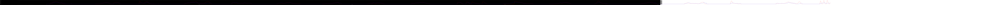

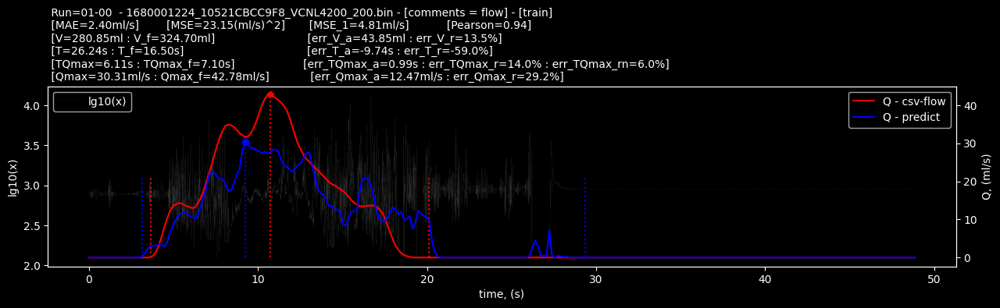

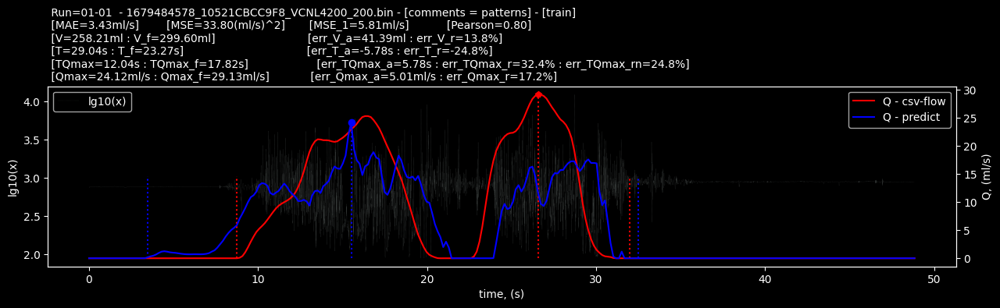

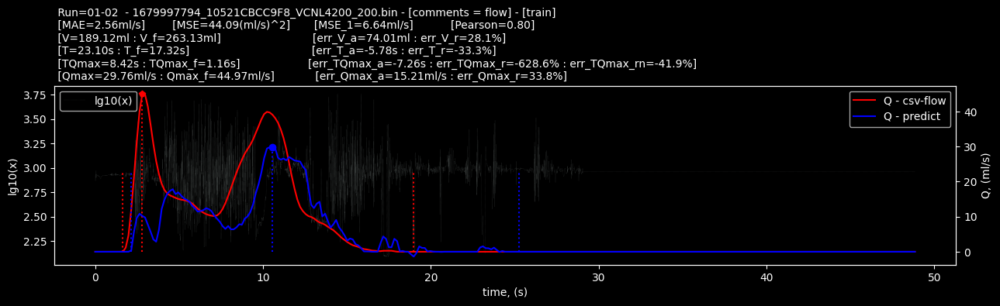

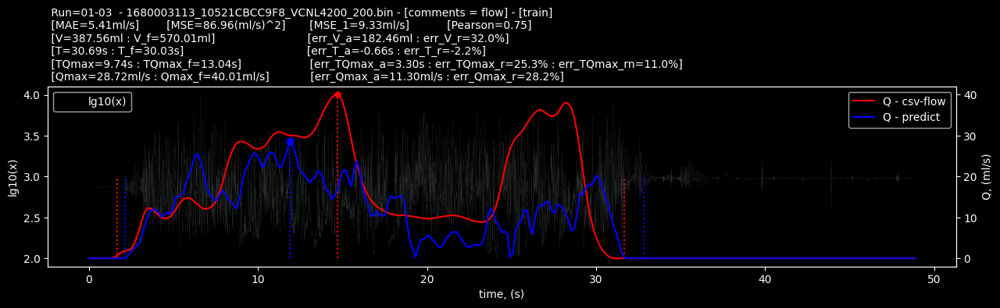

...

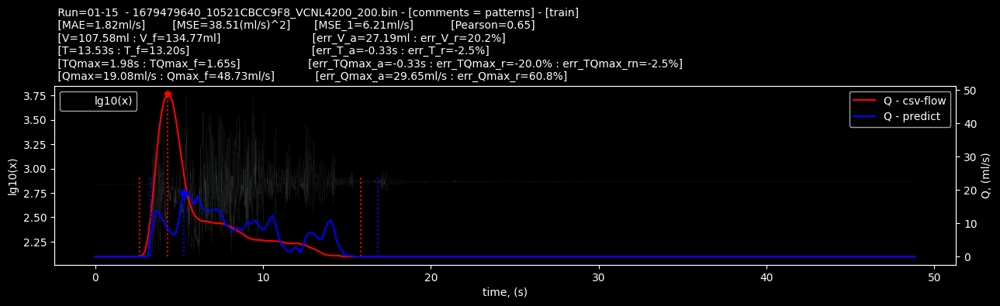

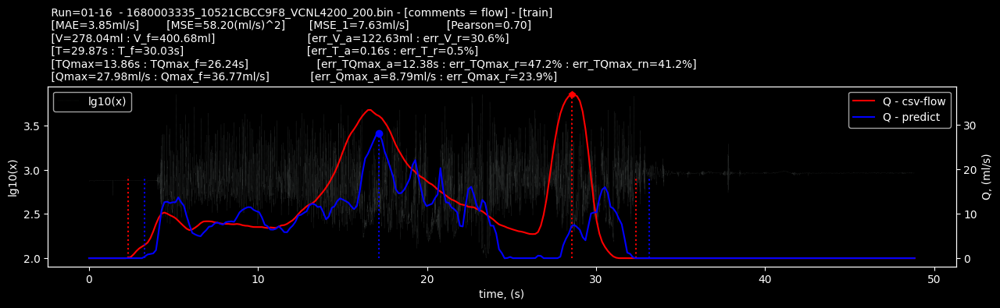

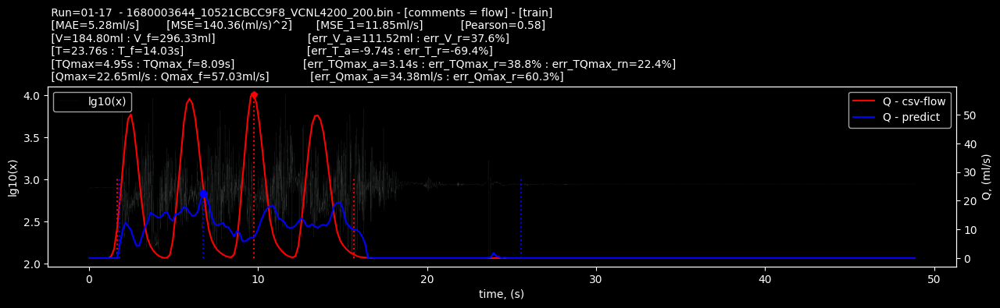

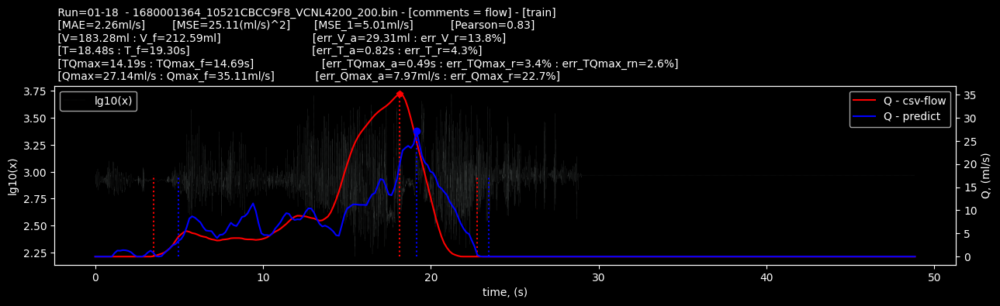

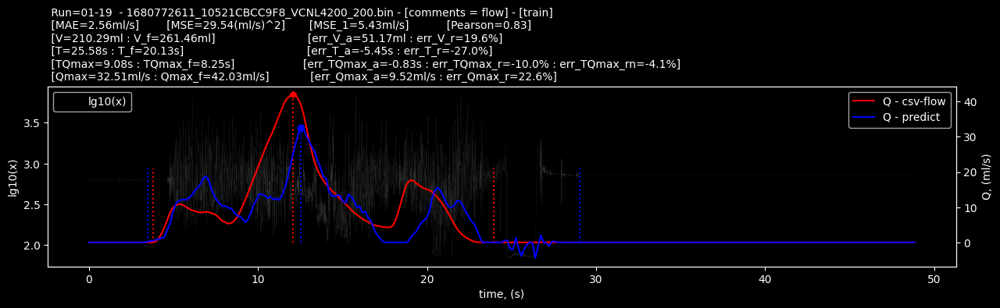

<ipython-input-26-9dacca161f47>:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result = df_result.append(df_N, ignore_index = True )


In [ ]:
#@title predict-Test_nofoam_1_best  
# (1x10f = 4m30s)
options = 'nofoam'    #-@param ["nofoam", "foam", "train"]
if options == 'nofoam': 
    df_calc = df_nf_test 
else: 
    df_calc = df_f_test

N_exp = run
arr_exp = [1]

if_save_png  = False     #@param {type:"boolean"} 
if_save_result = True   #@param {type:"boolean"} 
# __________calc - param___________
k_V=1
t1 = dl_segm / fs
t = [i*t1 for i in range(Nsegm)] 
t_n = [i/fs for i in range(max_L)]
result_save_name = ['N_exp', 'N', 'bin', 'T_f', 'T', 'err_T_a', 'err_T_r', 'TQmax_f', 'TQmax', 'err_TQmax_a', 'err_TQmax_r', 'err_TQmax_rn', 'Qmax_f', 'Qmax', 'err_Qmax_a', 'err_Qmax_r', 'V_f', 'V', 'err_V_a', 'err_V_r', 'MAE', 'MSE', 'MSE_1', 'Pearson', 'options']
df_N = pd.DataFrame(columns=result_save_name)
d1_save = dict(zip(result_save_name, [0]*len(result_save_name))) 

x_calc, y_calc = df_to_xy(df_calc, Nsegm, param_names)

n_parametr = len(param_names)
x_param = [0]*n_parametr     # ['xx'0, 'f_nf_1', 'L1'2, 'L2'3, 'Np', 'Nh', 'd', 'ds', 'f_03', 'f_1', 'd_f_03', 'd_f_1', 'd_f_1_28', 'd_f_1_5', 'd_f_5_15', 'd_f_15_20', 'd_f_20_28']
for p in range(n_parametr): x_param[p] = [i[-1][p] for i in x_calc]
st, fn = st_fn_div_d(Ne=len(y_calc), d=1, L1=Nsegm)

for N_exp in arr_exp:
    gpath_model = f'{gpath}{N_exp:02}'
    model_name_N = f'{gpath_model}/best_run_{N_exp:02}.h5'
    gpath_x = f'{gpath_model}/{options}'
    if not (os.path.exists(gpath_x)): os.mkdir(gpath_x)
    #___________load model___________
    model = load_model(model_name_N)

    #___________ prdict ___________
    pred_test = [model.predict(i.reshape((1, Nsegm, len(param_names))), verbose=0) for i in x_calc]
    pred_test = [i[-1][0] for i in pred_test]

    # All - plot(test)
    figure( figsize=(4*N_nf,3), dpi=80)
    plt.plot(y_calc, label=f'csv test({options})')
    plt.plot(pred_test, label='pred_test')
    plt.legend()
    if if_save_png: plt.savefig(f'{gpath_x}/all_{options}_{N_exp}.png' )  

    # culc - plot(test)
    predict_calc = np.array(pred_test)
    for i in range(len(df_calc)):   
        xi =  d_max['fl_f'] * k_V * predict_calc[st[i]:fn[i]]
        xi_f =  d_max['fl_f']*k_V * y_calc[st[i]:fn[i]]            

        i1, i2, iQmax, Qmax, V, T, TQmax = analiz_predict(xi, d_max['fl_f'], t1)
        i1_f, i2_f, iQmax_f, Qmax_f, V_f, T_f, TQmax_f = analiz_predict(xi_f, d_max['fl_f'], t1)

        err_T_a = (T_f-T);                  err_T_r = 100*err_T_a / T_f
        err_TQmax_a = (TQmax_f-TQmax);      err_TQmax_r = 100*err_TQmax_a / TQmax_f;    err_TQmax_rn = 100*err_TQmax_a / T_f;
        err_Qmax_a = (Qmax_f-Qmax);         err_Qmax_r = 100*err_Qmax_a / Qmax_f
        err_V_a = (V_f-V);                  err_V_r = 100*err_V_a / V_f
        MAE, MSE, MSE_1 =  MXE(xi, xi_f)
        Pearson = np.corrcoef(xi, xi_f)[0,1]

        d1_save['N_exp'] = N_exp; d1_save['N'] = i;             d1_save['bin'] = df_calc.bins_names.iloc[i];    
        d1_save['T'] = T;         d1_save['T_f'] = T_f;         d1_save['err_T_a'] = err_T_a;         d1_save['err_T_r'] = err_T_r
        d1_save['TQmax'] = TQmax; d1_save['TQmax_f'] = TQmax_f; d1_save['err_TQmax_a'] = err_TQmax_a; d1_save['err_TQmax_r'] = err_TQmax_r;  d1_save['err_TQmax_rn'] = err_TQmax_rn
        d1_save['Qmax'] = Qmax;   d1_save['Qmax_f'] = Qmax_f;   d1_save['err_Qmax_a'] = err_Qmax_a;   d1_save['err_Qmax_r'] = err_Qmax_r
        d1_save['V'] = V;         d1_save['V_f'] = V_f;         d1_save['err_V_a'] = err_V_a;         d1_save['err_V_r'] = err_V_r
        d1_save['MAE'] = MAE;     d1_save['MSE'] = MSE;         d1_save['MSE_1'] = MSE_1;             d1_save['Pearson'] = Pearson
        d1_save['options'] = options
    
        df_N = pd.concat([df_N, pd.DataFrame([d1_save])], ignore_index=True)

        row1 = df_xls.loc[df_xls.bins==d1_save['bin']].iloc[0]
        print('\n')
        title = f" Run={N_exp:02}-{i:02}  - {d1_save['bin']} - [comments = {row1.comments}] - [{row1.role}] \n"\
        f" [MAE={MAE:0.2f}ml/s]        [MSE={MSE:0.2f}(ml/s)^2]       [MSE_1={MSE_1:0.2f}ml/s]           [Pearson={Pearson:0.2f}] \n"\
        f" [V={V:0.2f}ml : V_f={V_f:0.2f}ml]                           [err_V_a={err_V_a:0.2f}ml : err_V_r={err_V_r:0.1f}%] \n"\
        f" [T={T:0.2f}s : T_f={T_f:0.2f}s]                                    [err_T_a={err_T_a:0.2f}s : err_T_r={err_T_r:0.1f}%] \n"\
        f" [TQmax={TQmax:0.2f}s : TQmax_f={TQmax_f:0.2f}s]                    [err_TQmax_a={err_TQmax_a:0.2f}s : err_TQmax_r={err_TQmax_r:0.1f}% : err_TQmax_rn={err_TQmax_rn:0.1f}%] \n"\
        f" [Qmax={Qmax:0.2f}ml/s : Qmax_f={Qmax_f:0.2f}ml/s]            [err_Qmax_a={err_Qmax_a:0.2f}ml/s : err_Qmax_r={err_Qmax_r:0.1f}%]"

        fig, ax0 = plt.subplots(1)
        fig.set_size_inches(15, 3 )   

        y_0 =  df_calc.bin[i]['x_lg']
        ax0.plot(t_n, y_0, ':',  color='#343837', label='lg10(x)', linewidth = 0.3) 
        ax0.legend(loc='upper left')
        ax0.set_ylabel('lg10(x)')
        ax0.set_xlabel('time, (s)')
        
        axes = ax0.twinx() 
        axes.plot(t, xi_f, c='r', label='Q - csv-flow')    # linestyles : {'solid', 'dashed', 'dashdot', 'dotted'},
        axes.stem([ iQmax_f*t1], [Qmax_f], linefmt=':r', markerfmt='rp',  basefmt='None', bottom = 0)
        axes.stem([i1_f*t1, i2_f*t1], [0.5*Qmax_f]*2, linefmt=':r', markerfmt='None',  basefmt='None', bottom = 0)

        axes.plot(t, xi, c='b', label='Q - predict')
        axes.stem([iQmax*t1], [Qmax], linefmt=':b', markerfmt='b', basefmt='None', bottom = 0)
        axes.stem([i1*t1, i2*t1], [0.5*Qmax_f]*2, linefmt=':b', markerfmt='None',  basefmt='None', bottom = 0)

        axes.legend()
        plt.ylabel( 'Q, (ml/s)')    
        plt.title(title, loc='left',  fontsize=10, fontweight=4 )
        # fig.legend(loc='upper left') 

        # ------ save bin.png -----        
        if if_save_png: plt.savefig( f'{gpath_x}/{d1_save["bin"]}_run{N_exp:02}_{i:02}.png', bbox_inches='tight' )    
        plt.show()
            
# ------ Загрузить df_result, дописать df_N_exp и сохранить --------
if if_save_result:
    df_result = pd.read_excel(exsel, excel_result_sheet).fillna(0)
    df_result = df_result.append(df_N, ignore_index = True )
    with pd.ExcelWriter(exsel, mode='a', if_sheet_exists="replace") as writer:  
        df_result.to_excel(writer, sheet_name=excel_result_sheet, index=False)


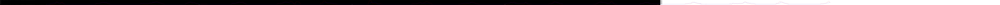

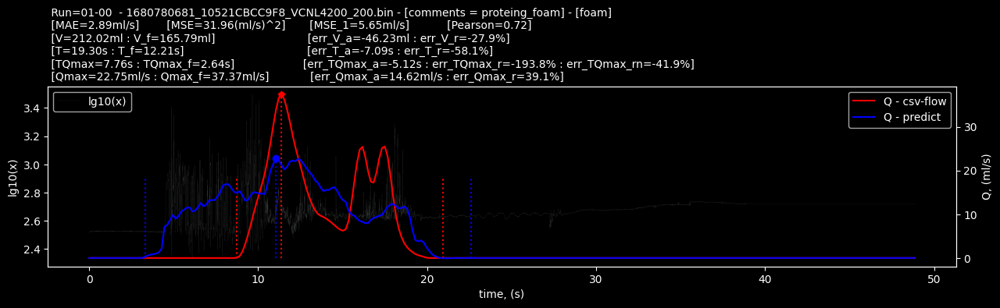

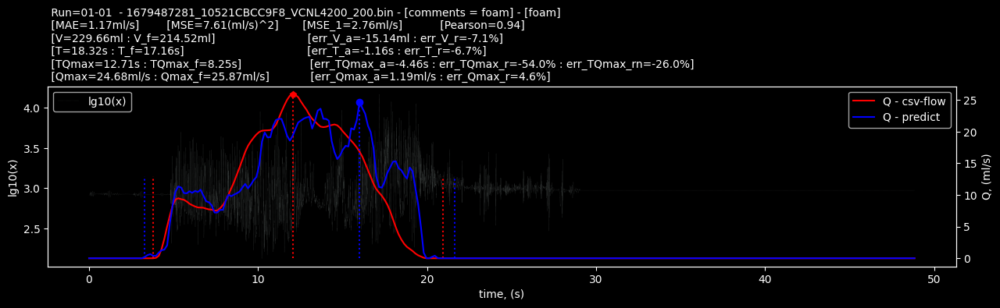

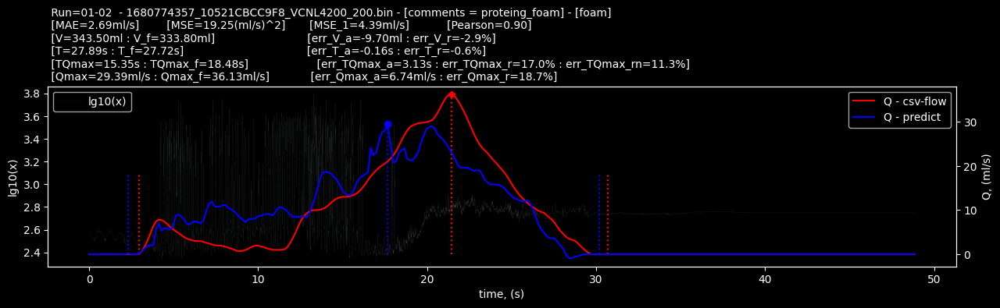

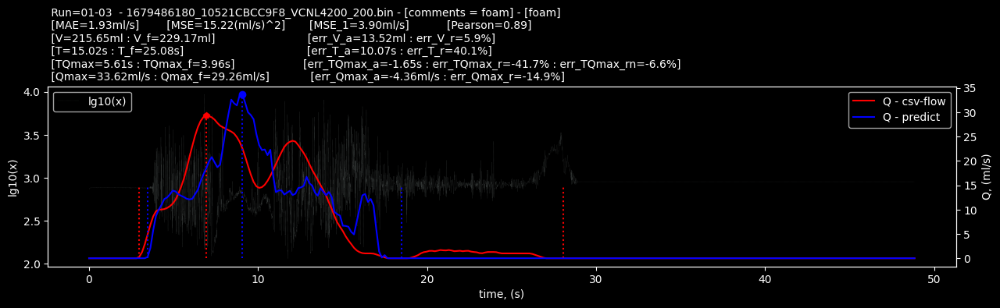

...

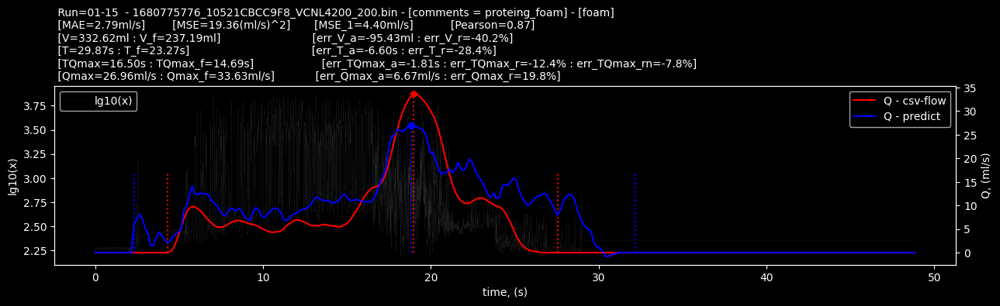

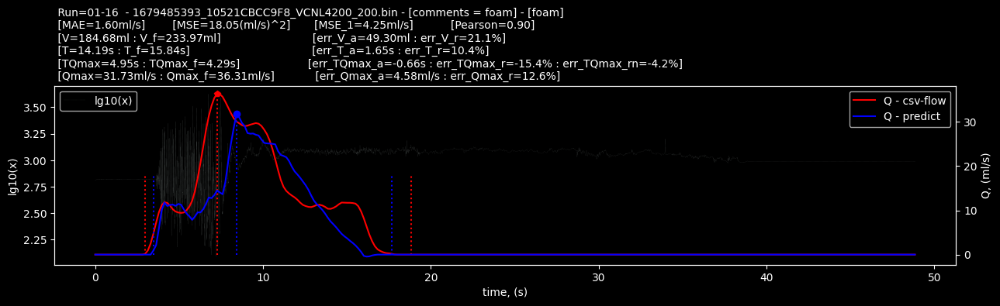

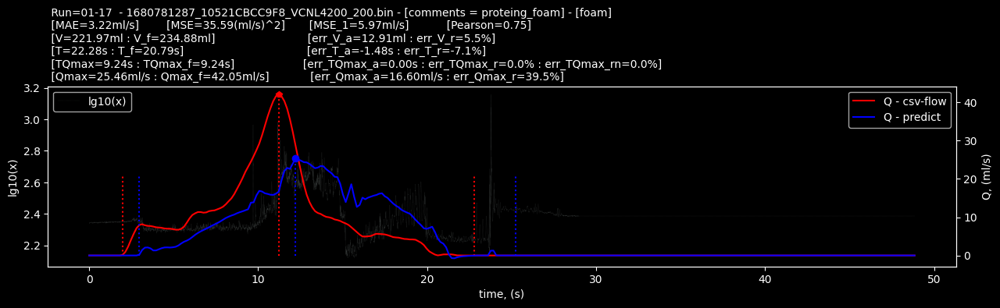

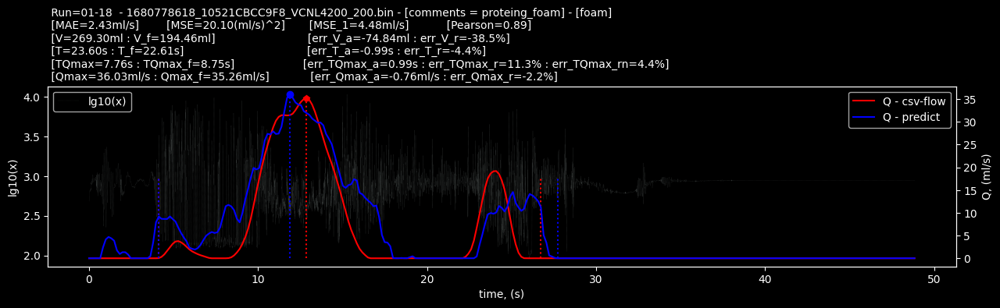

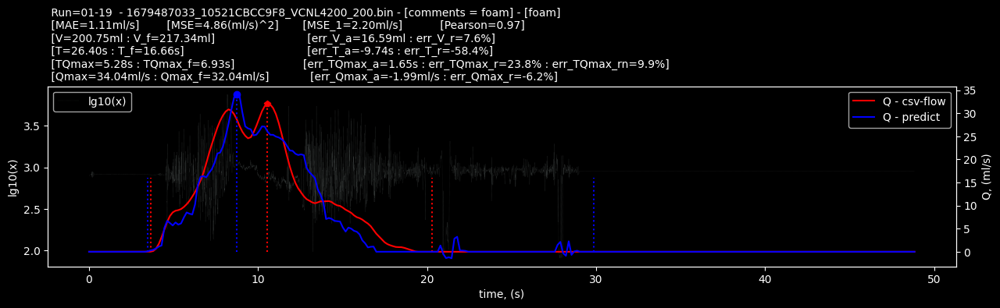

<ipython-input-27-5967bf8421ab>:114: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_result = df_result.append(df_N, ignore_index = True )


In [ ]:
#@title predict-Test_foam_1_best 
# (1x10f = 4m30s)
options = 'foam'    #-@param ["nofoam", "foam", "train"]
if options == 'nofoam': 
    df_calc = df_nf_test 
else: 
    df_calc = df_f_test

N_exp = run
arr_exp = [1]

if_save_png  = False     #@param {type:"boolean"} 
if_save_result = True   #@param {type:"boolean"} 
# __________calc - param___________
k_V=1
t1 = dl_segm / fs
t = [i*t1 for i in range(Nsegm)] 
t_n = [i/fs for i in range(max_L)]
result_save_name = ['N_exp', 'N', 'bin', 'T_f', 'T', 'err_T_a', 'err_T_r', 'TQmax_f', 'TQmax', 'err_TQmax_a', 'err_TQmax_r', 'err_TQmax_rn', 'Qmax_f', 'Qmax', 'err_Qmax_a', 'err_Qmax_r', 'V_f', 'V', 'err_V_a', 'err_V_r', 'MAE', 'MSE', 'MSE_1', 'Pearson', 'options']
df_N = pd.DataFrame(columns=result_save_name)
d1_save = dict(zip(result_save_name, [0]*len(result_save_name))) 

x_calc, y_calc = df_to_xy(df_calc, Nsegm, param_names)

n_parametr = len(param_names)
x_param = [0]*n_parametr     # ['xx'0, 'f_nf_1', 'L1'2, 'L2'3, 'Np', 'Nh', 'd', 'ds', 'f_03', 'f_1', 'd_f_03', 'd_f_1', 'd_f_1_28', 'd_f_1_5', 'd_f_5_15', 'd_f_15_20', 'd_f_20_28']
for p in range(n_parametr): x_param[p] = [i[-1][p] for i in x_calc]
st, fn = st_fn_div_d(Ne=len(y_calc), d=1, L1=Nsegm)

for N_exp in arr_exp:
    gpath_model = f'{gpath}{N_exp:02}'
    model_name_N = f'{gpath_model}/best_run_{N_exp:02}.h5'
    gpath_x = f'{gpath_model}/{options}'
    if not (os.path.exists(gpath_x)): os.mkdir(gpath_x)
    #___________load model___________
    model = load_model(model_name_N)

    #___________ prdict ___________
    pred_test = [model.predict(i.reshape((1, Nsegm, len(param_names))), verbose=0) for i in x_calc]
    pred_test = [i[-1][0] for i in pred_test]

    # All - plot(test)
    figure( figsize=(4*N_nf,3), dpi=80)
    plt.plot(y_calc, label=f'csv test({options})')
    plt.plot(pred_test, label='pred_test')
    plt.legend()
    if if_save_png: plt.savefig(f'{gpath_x}/all_{options}_{N_exp}.png' )  

    # culc - plot(test)
    predict_calc = np.array(pred_test)
    for i in range(len(df_calc)):   
        xi =  d_max['fl_f'] * k_V * predict_calc[st[i]:fn[i]]
        xi_f =  d_max['fl_f']*k_V * y_calc[st[i]:fn[i]]            

        i1, i2, iQmax, Qmax, V, T, TQmax = analiz_predict(xi, d_max['fl_f'], t1)
        i1_f, i2_f, iQmax_f, Qmax_f, V_f, T_f, TQmax_f = analiz_predict(xi_f, d_max['fl_f'], t1)

        err_T_a = (T_f-T);                  err_T_r = 100*err_T_a / T_f
        err_TQmax_a = (TQmax_f-TQmax);      err_TQmax_r = 100*err_TQmax_a / TQmax_f;    err_TQmax_rn = 100*err_TQmax_a / T_f;
        err_Qmax_a = (Qmax_f-Qmax);         err_Qmax_r = 100*err_Qmax_a / Qmax_f
        err_V_a = (V_f-V);                  err_V_r = 100*err_V_a / V_f
        MAE, MSE, MSE_1 =  MXE(xi, xi_f)
        Pearson = np.corrcoef(xi, xi_f)[0,1]

        d1_save['N_exp'] = N_exp; d1_save['N'] = i;             d1_save['bin'] = df_calc.bins_names.iloc[i];    
        d1_save['T'] = T;         d1_save['T_f'] = T_f;         d1_save['err_T_a'] = err_T_a;         d1_save['err_T_r'] = err_T_r
        d1_save['TQmax'] = TQmax; d1_save['TQmax_f'] = TQmax_f; d1_save['err_TQmax_a'] = err_TQmax_a; d1_save['err_TQmax_r'] = err_TQmax_r;  d1_save['err_TQmax_rn'] = err_TQmax_rn
        d1_save['Qmax'] = Qmax;   d1_save['Qmax_f'] = Qmax_f;   d1_save['err_Qmax_a'] = err_Qmax_a;   d1_save['err_Qmax_r'] = err_Qmax_r
        d1_save['V'] = V;         d1_save['V_f'] = V_f;         d1_save['err_V_a'] = err_V_a;         d1_save['err_V_r'] = err_V_r
        d1_save['MAE'] = MAE;     d1_save['MSE'] = MSE;         d1_save['MSE_1'] = MSE_1;             d1_save['Pearson'] = Pearson
        d1_save['options'] = options
    
        df_N = pd.concat([df_N, pd.DataFrame([d1_save])], ignore_index=True)

        row1 = df_xls.loc[df_xls.bins==d1_save['bin']].iloc[0]
        print('\n')
        title = f" Run={N_exp:02}-{i:02}  - {d1_save['bin']} - [comments = {row1.comments}] - [{row1.role}] \n"\
        f" [MAE={MAE:0.2f}ml/s]        [MSE={MSE:0.2f}(ml/s)^2]       [MSE_1={MSE_1:0.2f}ml/s]           [Pearson={Pearson:0.2f}] \n"\
        f" [V={V:0.2f}ml : V_f={V_f:0.2f}ml]                           [err_V_a={err_V_a:0.2f}ml : err_V_r={err_V_r:0.1f}%] \n"\
        f" [T={T:0.2f}s : T_f={T_f:0.2f}s]                                    [err_T_a={err_T_a:0.2f}s : err_T_r={err_T_r:0.1f}%] \n"\
        f" [TQmax={TQmax:0.2f}s : TQmax_f={TQmax_f:0.2f}s]                    [err_TQmax_a={err_TQmax_a:0.2f}s : err_TQmax_r={err_TQmax_r:0.1f}% : err_TQmax_rn={err_TQmax_rn:0.1f}%] \n"\
        f" [Qmax={Qmax:0.2f}ml/s : Qmax_f={Qmax_f:0.2f}ml/s]            [err_Qmax_a={err_Qmax_a:0.2f}ml/s : err_Qmax_r={err_Qmax_r:0.1f}%]"

        fig, ax0 = plt.subplots(1)
        fig.set_size_inches(15, 3 )   

        y_0 =  df_calc.bin[i]['x_lg']
        ax0.plot(t_n, y_0, ':',  color='#343837', label='lg10(x)', linewidth = 0.3) 
        ax0.legend(loc='upper left')
        ax0.set_ylabel('lg10(x)')
        ax0.set_xlabel('time, (s)')
        
        axes = ax0.twinx() 
        axes.plot(t, xi_f, c='r', label='Q - csv-flow')    # linestyles : {'solid', 'dashed', 'dashdot', 'dotted'},
        axes.stem([ iQmax_f*t1], [Qmax_f], linefmt=':r', markerfmt='rp',  basefmt='None', bottom = 0)
        axes.stem([i1_f*t1, i2_f*t1], [0.5*Qmax_f]*2, linefmt=':r', markerfmt='None',  basefmt='None', bottom = 0)

        axes.plot(t, xi, c='b', label='Q - predict')
        axes.stem([iQmax*t1], [Qmax], linefmt=':b', markerfmt='b', basefmt='None', bottom = 0)
        axes.stem([i1*t1, i2*t1], [0.5*Qmax_f]*2, linefmt=':b', markerfmt='None',  basefmt='None', bottom = 0)

        axes.legend()
        plt.ylabel( 'Q, (ml/s)')    
        plt.title(title, loc='left',  fontsize=10, fontweight=4 )
        # fig.legend(loc='upper left') 

        # ------ save bin.png -----        
        if if_save_png: plt.savefig( f'{gpath_x}/{d1_save["bin"]}_run{N_exp:02}_{i:02}.png', bbox_inches='tight' )    
        plt.show()
            
# ------ Загрузить df_result, дописать df_N_exp и сохранить --------
if if_save_result:
    df_result = pd.read_excel(exsel, excel_result_sheet).fillna(0)
    df_result = df_result.append(df_N, ignore_index = True )
    with pd.ExcelWriter(exsel, mode='a', if_sheet_exists="replace") as writer:  
        df_result.to_excel(writer, sheet_name=excel_result_sheet, index=False)


# Result TABLE

In [ ]:
exsel = '/gdrive/MyDrive/korobool/fs200/best/best.xlsx'
col_filter = ['N_exp', 'N', 'bin','err_T_a', 'err_T_r', 'err_TQmax_a', 'err_TQmax_r', 'err_TQmax_rn', 'err_Qmax_a', 'err_Qmax_r', 'err_V_a', 'err_V_r', 'MAE','MSE', 'MSE_1', 'Pearson', 'options']
df_result = pd.read_excel(exsel, excel_result_sheet, usecols=col_filter).fillna(0)  

def add_mean_df(df_f):
    t = df_f.mean().to_dict()
    d= {'mean':'mean'}
    for k in col_filter: 
        if (k in t): d[k] = [t[k]]
        else: d[k] = [0]
    df1 = pd.DataFrame(d)
    df1.set_index(['mean'], inplace = True)
    df1 = pd.concat([df1, df_f])         # +row
    return df1


In [ ]:
#@title mean + filter
filter_run = "1"    #@param [0, 1, 2, 3, 4]
filter_run = int(filter_run)
filter_foam  = True     #@param {type:"boolean"} 
filter_nofoam = True   #@param {type:"boolean"} 
filter_options = []
if filter_foam: filter_options += ['foam']
if filter_nofoam: filter_options += ['nofoam']

df_filter = df_result[df_result['N_exp'] == filter_run][df_result['options'].isin(filter_options)].reset_index(drop=True) 

add_mean_df(df_filter[:20])


<ipython-input-29-785cbd880ded>:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  t = df_f.mean().to_dict()


,N_exp,N,bin,err_T_a,err_T_r,err_TQmax_a,err_TQmax_r,err_TQmax_rn,err_Qmax_a,err_Qmax_r,err_V_a,err_V_r,MAE,MSE,MSE_1,Pearson,options
mean,1.0,9.5,0,-2.4915,-14.575353,0.88275,-45.582693,1.041721,9.423971,20.822489,44.972069,12.346324,2.958927,40.686687,5.928647,0.794598,0
0,1.0,0.0,1680001224_10521CBCC9F8_VCNL4200_200.bin,-9.7350,-59.000000,0.99000,13.953488,6.000000,12.472539,29.156026,43.845496,13.503539,2.400570,23.152377,4.811692,0.936331,nofoam
1,1.0,1.0,1679484578_10521CBCC9F8_VCNL4200_200.bin,-5.7750,-24.822695,5.77500,32.407407,24.822695,5.006429,17.187508,41.386284,13.813797,3.434732,33.803316,5.814062,0.797136,nofoam
2,1.0,2.0,1679997794_10521CBCC9F8_VCNL4200_200.bin,-5.7750,-33.333333,-7.26000,-628.571429,-41.904762,15.209002,33.821162,74.012004,28.127511,2.559847,44.094627,6.640379,0.802365,nofoam
3,1.0,3.0,1680003113_10521CBCC9F8_VCNL4200_200.bin,-0.6600,-2.197802,3.30000,25.316456,10.989011,11.297917,28.234302,182.457919,32.009350,5.406040,86.958680,9.325164,0.754598,nofoam
4,1.0,4.0,1679998554_10521CBCC9F8_VCNL4200_200.bin,0.0000,0.000000,-3.79500,-209.090909,-15.862069,-6.695212,-37.560285,3.782770,1.376973,1.560445,8.362412,2.891783,0.914443,nofoam
5,1.0,5.0,1680772117_10521CBCC9F8_VCNL4200_200.bin,5.6100,19.540230,8.58000,59.090909,29.885057,3.929568,15.363105,36.317789,12.977559,2.577869,18.473333,4.298062,0.827879,nofoam
6,1.0,6.0,1679479409_10521CBCC9F8_VCNL4200_200.bin,-4.1250,-22.522523,-2.80500,-20.000000,-15.315315,3.496413,12.405517,-23.854691,-13.270862,1.770373,15.226197,3.902076,0.835267,nofoam
7,1.0,7.0,1679479595_10521CBCC9F8_VCNL4200_200.bin,0.4950,2.459016,-7.26000,-110.000000,-36.065574,-3.731600,-20.317216,-56.231189,-34.739823,1.969731,17.585896,4.193554,0.802153,nofoam
8,1.0,8.0,1680002860_10521CBCC9F8_VCNL4200_200.bin,0.4950,2.400000,2.64000,22.222222,12.800000,3.471529,12.734049,52.913293,17.663310,1.598693,10.524619,3.244167,0.934023,nofoam


err_T_a	err_T_r	err_TQmax_a	err_TQmax_r	err_TQmax_rn	err_Qmax_a	err_Qmax_r	V_f	V	err_V_a	err_V_r	MAE	MSE	MSE_1	Pearson	options

In [ ]:
add_mean_df(df_filter[20:])

<ipython-input-29-785cbd880ded>:6: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  t = df_f.mean().to_dict()


,N_exp,N,bin,err_T_a,err_T_r,err_TQmax_a,err_TQmax_r,err_TQmax_rn,err_Qmax_a,err_Qmax_r,err_V_a,err_V_r,MAE,MSE,MSE_1,Pearson,options
mean,1.0,9.5,0,-1.5015,-11.514826,0.23925,-16.127798,-1.355146,7.291285,18.500240,17.344790,2.368425,2.703104,34.060893,5.276417,0.818393,0
20,1.0,0.0,1680780681_10521CBCC9F8_VCNL4200_200.bin,-7.0950,-58.108108,-5.11500,-193.750000,-41.891892,14.616271,39.111288,-46.229097,-27.884177,2.894533,31.955396,5.652910,0.723180,foam
21,1.0,1.0,1679487281_10521CBCC9F8_VCNL4200_200.bin,-1.1550,-6.730769,-4.45500,-54.000000,-25.961538,1.187137,4.589541,-15.141458,-7.058182,1.172360,7.605927,2.757885,0.935288,foam
22,1.0,2.0,1680774357_10521CBCC9F8_VCNL4200_200.bin,-0.1650,-0.595238,3.13500,16.964286,11.309524,6.744283,18.666054,-9.696309,-2.904835,2.686897,19.246671,4.387103,0.900785,foam
23,1.0,3.0,1679486180_10521CBCC9F8_VCNL4200_200.bin,10.0650,40.131579,-1.65000,-41.666667,-6.578947,-4.357474,-14.892302,13.516704,5.898195,1.928220,15.223940,3.901787,0.889386,foam
24,1.0,4.0,1679487629_10521CBCC9F8_VCNL4200_200.bin,-1.1550,-6.422018,-0.49500,-5.660377,-2.752294,0.597561,2.029445,6.608473,2.564953,1.162170,6.336307,2.517202,0.961862,foam
25,1.0,5.0,1680774731_10521CBCC9F8_VCNL4200_200.bin,6.4350,23.214286,3.46500,22.580645,12.500000,11.275590,28.142907,268.095508,49.946549,6.155737,135.020765,11.619844,0.653559,foam
26,1.0,6.0,1680780740_10521CBCC9F8_VCNL4200_200.bin,-7.5900,-62.162162,-2.80500,-70.833333,-22.972973,18.926210,44.778803,26.321424,11.359768,4.098008,68.469443,8.274626,0.598894,foam
27,1.0,7.0,1679486757_10521CBCC9F8_VCNL4200_200.bin,6.1050,25.694444,-2.80500,-58.620690,-11.805556,23.141814,44.308194,47.246497,21.154381,4.470892,110.350677,10.504793,0.449470,foam
28,1.0,8.0,1680781892_10521CBCC9F8_VCNL4200_200.bin,3.3000,13.333333,7.59000,46.464646,30.666667,20.392844,57.787685,165.250135,50.388178,3.697254,56.917323,7.544357,0.782062,foam


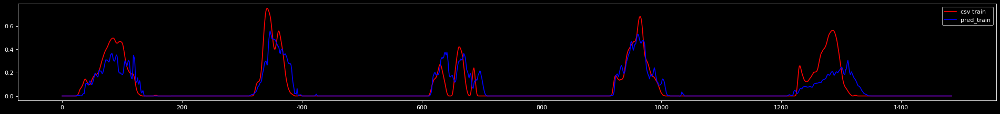

In [ ]:
#@title predict - Train_N
N = 5
df_train = df_mix_train[:N]      # df_0_f    df_0_mix
x_train, y_train = df_to_xy(df_train, Nsegm, param_names)
pred_train = [model.predict(i.reshape((1, Nsegm, len(param_names))), verbose=0) for i in x_train]
pred_train = [i[-1][0] for i in pred_train]

# All - plot - Train_N
figure( figsize=(4*N,3), dpi=80)
plt.plot(y_train, label='csv train')
plt.plot(pred_train, label='pred_train')
plt.legend()

In [ ]:
#@title load model+d_param 

# model = load_model(gpath+'fs200_0.h5')
# with open(gpath+'fs200.json') as f:
#             txt = f.read()    
#             d_param = json.loads(txt)    
# d_max=d_param['d_max'];                 
# param_names = d_param['param_names'];   n_parametr = d_param['n_parametr'] #=len(param_names)
# Nsegm = d_param['Nsegm'];               Nelem = d_param['Nelem']
# dl_segm = d_param['dl_segm'];           segment = d_param['segment']
# fs = d_param['fs'];                     shift = d_param['shift']
# dt_start = d_param['dt_start'];         dt_finish = d_param['dt_finish']
